In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np


In [3]:
initial = pd.read_csv('data/powerlifting.csv')


In [4]:
initial.head(10)

,Name,Sex,Event,Equipment,Age,AgeClass,BirthYearClass,Division,BodyweightKg,WeightClassKg,...,Glossbrenner,Goodlift,Tested,Country,Federation,ParentFederation,Date,MeetCountry,MeetState,MeetName
0,Tucker Sanders,M,B,Single-ply,15.0,13-15,14-18,Teen 14-15,52.0,52,...,82.14,49.90,NaN,USA,USABPA,NaN,2019-04-06,USA,TX,Ronnie Coleman Classic
1,Xander Womack,M,B,Single-ply,14.0,13-15,14-18,Teen 14-15,100.0,100,...,94.46,51.67,NaN,USA,USABPA,NaN,2019-04-06,USA,TX,Ronnie Coleman Classic
2,Michael Womack III,M,B,Single-ply,16.0,16-17,14-18,Teen 16-17,67.5,67.5,...,82.33,46.65,NaN,USA,USABPA,NaN,2019-04-06,USA,TX,Ronnie Coleman Classic
3,Logan McCurley,M,B,Single-ply,16.0,16-17,14-18,Teen 16-17,75.0,75,...,80.90,45.24,NaN,USA,USABPA,NaN,2019-04-06,USA,TX,Ronnie Coleman Classic
4,Emily Jondron,F,B,Single-ply,21.0,20-23,19-23,Juniors 20-25,90.0,90,...,120.17,81.45,NaN,USA,USABPA,NaN,2019-04-06,USA,TX,Ronnie Coleman Classic
5,Harley Sanders,M,B,Multi-ply,16.0,16-17,14-18,Open,75.0,75,...,172.13,96.25,NaN,USA,USABPA,NaN,2019-04-06,USA,TX,Ronnie Coleman Classic
6,Chris Sanders,M,B,Multi-ply,42.0,40-44,40-49,Masters 40-46,82.5,82.5,...,106.36,58.98,NaN,USA,USABPA,NaN,2019-04-06,USA,TX,Ronnie Coleman Classic
7,Larry Cox,M,B,Multi-ply,42.0,40-44,40-49,Masters 40-46,90.0,90,...,186.61,102.89,NaN,USA,USABPA,NaN,2019-04-06,USA,TX,Ronnie Coleman Classic
8,Brian Mincher,M,B,Multi-ply,44.0,40-44,40-49,Masters 40-46,90.0,90,...,214.14,118.07,NaN,USA,USABPA,NaN,2019-04-06,USA,TX,Ronnie Coleman Classic
9,Cody White,M,B,Multi-ply,26.0,24-34,24-39,Open,NaN,140+,...,NaN,NaN,NaN,USA,USABPA,NaN,2019-04-06,USA,TX,Ronnie Coleman Classic


In [5]:
initial.loc[initial['Equipment'] == 'Raw', 'Raw'] = True

In [6]:
initial.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1907649 entries, 0 to 1907648
Data columns (total 40 columns):
 #   Column            Dtype  
---  ------            -----  
 0   Name              object 
 1   Sex               object 
 2   Event             object 
 3   Equipment         object 
 4   Age               float64
 5   AgeClass          object 
 6   BirthYearClass    object 
 7   Division          object 
 8   BodyweightKg      float64
 9   WeightClassKg     object 
 10  Squat1Kg          float64
 11  Squat2Kg          float64
 12  Squat3Kg          float64
 13  Squat4Kg          float64
 14  Best3SquatKg      float64
 15  Bench1Kg          float64
 16  Bench2Kg          float64
 17  Bench3Kg          float64
 18  Bench4Kg          float64
 19  Best3BenchKg      float64
 20  Deadlift1Kg       float64
 21  Deadlift2Kg       float64
 22  Deadlift3Kg       float64
 23  Deadlift4Kg       float64
 24  Best3DeadliftKg   float64
 25  TotalKg           float64
 26  Place         

In [7]:
cols = [33,34,30]
initial.drop(initial.columns[cols],axis=1,inplace=True)

In [8]:
def add_time_cols(df, datecol):
    df['timestamp'] = pd.to_datetime(df[datecol], errors='coerce')
    df['hour'] = df['timestamp'].dt.hour
    df['day'] = df['timestamp'].dt.dayofweek
    df['weekday'] = df['timestamp'].dt.day_name()

In [9]:
add_time_cols(initial, 'Date')

In [10]:
initial = initial.dropna(subset=['Age', 'AgeClass'])

In [11]:
initial.isnull().any()

Name               False
Sex                False
Event              False
Equipment          False
Age                False
AgeClass           False
BirthYearClass      True
Division            True
BodyweightKg        True
WeightClassKg       True
Squat1Kg            True
Squat2Kg            True
Squat3Kg            True
Squat4Kg            True
Best3SquatKg        True
Bench1Kg            True
Bench2Kg            True
Bench3Kg            True
Bench4Kg            True
Best3BenchKg        True
Deadlift1Kg         True
Deadlift2Kg         True
Deadlift3Kg         True
Deadlift4Kg         True
Best3DeadliftKg     True
TotalKg             True
Place              False
Dots                True
Wilks               True
Glossbrenner        True
Tested              True
Country             True
Date               False
MeetCountry        False
MeetState           True
MeetName           False
Raw                 True
timestamp          False
hour               False
day                False


In [12]:
print(initial['Equipment'].value_counts())

Raw           541629
Single-ply    329819
Wraps         104186
Multi-ply      69499
Straps            33
Name: Equipment, dtype: int64


In [13]:
ageClass = list(initial['AgeClass'].unique())
initial['AgeClass'] = pd.Categorical(initial['AgeClass'], categories=ageClass, ordered=True)

In [14]:
def convert_category(col_name, df):
    cats = list(df[col_name].unique())
    df[col_name] = pd.Categordfl(initial[col_name], categories=cats, ordered=True)


In [15]:
cat_arr = ['AgeClass', 'Equipment']

In [34]:
raw = initial[initial["Equipment"] == 'Raw'].copy()
raw.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 541629 entries, 44 to 1907618
Data columns (total 41 columns):
 #   Column           Non-Null Count   Dtype         
---  ------           --------------   -----         
 0   Name             541629 non-null  object        
 1   Sex              541629 non-null  object        
 2   Event            541629 non-null  object        
 3   Equipment        541629 non-null  object        
 4   Age              541629 non-null  float64       
 5   AgeClass         541629 non-null  category      
 6   BirthYearClass   524168 non-null  object        
 7   Division         541192 non-null  object        
 8   BodyweightKg     540389 non-null  float64       
 9   WeightClassKg    537862 non-null  object        
 10  Squat1Kg         206899 non-null  float64       
 11  Squat2Kg         205175 non-null  float64       
 12  Squat3Kg         201114 non-null  float64       
 13  Squat4Kg         1492 non-null    float64       
 14  Best3SquatKg     3

In [17]:
raw = raw[raw['Place'] == 1]

In [35]:
raw.head()

,Name,Sex,Event,Equipment,Age,AgeClass,BirthYearClass,Division,BodyweightKg,WeightClassKg,...,Country,Date,MeetCountry,MeetState,MeetName,Raw,timestamp,hour,day,weekday
44,Etelvina Neves,F,SBD,Raw,32.5,24-34,24-39,Open,66.8,67.5,...,Portugal,2019-03-02,Portugal,NaN,Campeonato Nacional de Powerlifting,True,2019-03-02,0,5,Saturday
50,Rafael Loureiro,M,SBD,Raw,18.5,18-19,NaN,T 18-19,62.9,67.5,...,NaN,2019-03-02,Portugal,NaN,Campeonato Nacional de Powerlifting,True,2019-03-02,0,5,Saturday
53,João Caetano,M,SBD,Raw,18.5,18-19,19-23,T 18-19,70.2,75,...,NaN,2019-03-02,Portugal,NaN,Campeonato Nacional de Powerlifting,True,2019-03-02,0,5,Saturday
63,Josué Oliveira,M,SBD,Raw,23.0,20-23,24-39,Junior,77.4,82.5,...,Portugal,2019-03-02,Portugal,NaN,Campeonato Nacional de Powerlifting,True,2019-03-02,0,5,Saturday
66,Josué Oliveira,M,SBD,Raw,23.0,20-23,24-39,Open,77.4,82.5,...,Portugal,2019-03-02,Portugal,NaN,Campeonato Nacional de Powerlifting,True,2019-03-02,0,5,Saturday


In [36]:
def get_value_counts(df, col_name):
    print(df[col_name].value_counts())

In [37]:
get_value_counts(raw, 'Place')

1      282523
2       89191
3       46315
4       27789
DQ      20926
        ...  
106         1
119         1
109         1
116         1
113         1
Name: Place, Length: 124, dtype: int64


In [38]:
firstplaceRaw = raw[raw['Place'] == '1']

In [39]:
firstplaceRaw.head(10)

,Name,Sex,Event,Equipment,Age,AgeClass,BirthYearClass,Division,BodyweightKg,WeightClassKg,...,Country,Date,MeetCountry,MeetState,MeetName,Raw,timestamp,hour,day,weekday
44,Etelvina Neves,F,SBD,Raw,32.5,24-34,24-39,Open,66.8,67.5,...,Portugal,2019-03-02,Portugal,NaN,Campeonato Nacional de Powerlifting,True,2019-03-02,0,5,Saturday
50,Rafael Loureiro,M,SBD,Raw,18.5,18-19,NaN,T 18-19,62.9,67.5,...,NaN,2019-03-02,Portugal,NaN,Campeonato Nacional de Powerlifting,True,2019-03-02,0,5,Saturday
53,João Caetano,M,SBD,Raw,18.5,18-19,19-23,T 18-19,70.2,75,...,NaN,2019-03-02,Portugal,NaN,Campeonato Nacional de Powerlifting,True,2019-03-02,0,5,Saturday
63,Josué Oliveira,M,SBD,Raw,23.0,20-23,24-39,Junior,77.4,82.5,...,Portugal,2019-03-02,Portugal,NaN,Campeonato Nacional de Powerlifting,True,2019-03-02,0,5,Saturday
66,Josué Oliveira,M,SBD,Raw,23.0,20-23,24-39,Open,77.4,82.5,...,Portugal,2019-03-02,Portugal,NaN,Campeonato Nacional de Powerlifting,True,2019-03-02,0,5,Saturday
75,Luis Simões,M,SBD,Raw,37.0,35-39,24-39,Open,88.0,90,...,Portugal,2019-03-02,Portugal,NaN,Campeonato Nacional de Powerlifting,True,2019-03-02,0,5,Saturday
88,António Azevedo,M,SBD,Raw,15.0,13-15,14-18,T 13-15,105.0,110,...,NaN,2019-03-02,Portugal,NaN,Campeonato Nacional de Powerlifting,True,2019-03-02,0,5,Saturday
89,Flávio Martins,M,SBD,Raw,26.5,24-34,24-39,Open,109.0,110,...,Portugal,2019-03-02,Portugal,NaN,Campeonato Nacional de Powerlifting,True,2019-03-02,0,5,Saturday
91,Luis Batista,M,SBD,Raw,44.0,40-44,40-49,Open,121.0,125,...,Portugal,2019-03-02,Portugal,NaN,Campeonato Nacional de Powerlifting,True,2019-03-02,0,5,Saturday
92,Luis Batista,M,SBD,Raw,44.0,40-44,40-49,M 40-44,121.0,125,...,Portugal,2019-03-02,Portugal,NaN,Campeonato Nacional de Powerlifting,True,2019-03-02,0,5,Saturday


In [40]:
femaleFirstplaceRaw = firstplaceRaw[firstplaceRaw['Sex'] == 'F']
get_value_counts(femaleFirstplaceRaw, 'WeightClassKg')

67.5    9595
75      7857
52      7468
60      7382
72      7021
        ... 
51.7       1
80+        1
99.7       1
53+        1
54.8       1
Name: WeightClassKg, Length: 81, dtype: int64


In [41]:
get_value_counts(firstplaceRaw[firstplaceRaw['Event'] == 'SBD'], 'WeightClassKg')

75       9509
82.5     9428
90       9138
67.5     8096
93       7188
         ... 
60+         1
109.7       1
44.5        1
73          1
72.5        1
Name: WeightClassKg, Length: 96, dtype: int64


In [42]:
counts = firstplaceRaw['WeightClassKg'].value_counts()

firstRawFiltered = firstplaceRaw[~firstplaceRaw['WeightClassKg'].isin(counts[counts < 5000].index)]


In [43]:

firstRawFiltered.head()

,Name,Sex,Event,Equipment,Age,AgeClass,BirthYearClass,Division,BodyweightKg,WeightClassKg,...,Country,Date,MeetCountry,MeetState,MeetName,Raw,timestamp,hour,day,weekday
44,Etelvina Neves,F,SBD,Raw,32.5,24-34,24-39,Open,66.8,67.5,...,Portugal,2019-03-02,Portugal,NaN,Campeonato Nacional de Powerlifting,True,2019-03-02,0,5,Saturday
50,Rafael Loureiro,M,SBD,Raw,18.5,18-19,NaN,T 18-19,62.9,67.5,...,NaN,2019-03-02,Portugal,NaN,Campeonato Nacional de Powerlifting,True,2019-03-02,0,5,Saturday
53,João Caetano,M,SBD,Raw,18.5,18-19,19-23,T 18-19,70.2,75,...,NaN,2019-03-02,Portugal,NaN,Campeonato Nacional de Powerlifting,True,2019-03-02,0,5,Saturday
63,Josué Oliveira,M,SBD,Raw,23.0,20-23,24-39,Junior,77.4,82.5,...,Portugal,2019-03-02,Portugal,NaN,Campeonato Nacional de Powerlifting,True,2019-03-02,0,5,Saturday
66,Josué Oliveira,M,SBD,Raw,23.0,20-23,24-39,Open,77.4,82.5,...,Portugal,2019-03-02,Portugal,NaN,Campeonato Nacional de Powerlifting,True,2019-03-02,0,5,Saturday


In [44]:
get_value_counts(firstRawFiltered, 'WeightClassKg')

90      24460
82.5    24045
75      23603
100     21248
67.5    19370
110     17558
125     13228
60      11161
93      10014
83       9520
52       9050
105      9043
56       8068
74       7955
72       7034
120      6808
63       6304
140      6191
84       5531
66       5106
120+     5056
Name: WeightClassKg, dtype: int64


In [45]:
femRaw = firstRawFiltered[firstRawFiltered['Sex'] == 'F'].copy()

In [46]:
get_value_counts(femRaw, 'WeightClassKg')

67.5    9595
75      7857
52      7468
60      7382
72      7021
63      6303
56      6042
84      5531
82.5    5044
90      3406
100      331
110      137
83         2
125        2
Name: WeightClassKg, dtype: int64


In [47]:
def filter_by_value_count(df, col_name, threshold):
    counts = df[col_name].value_counts()
    return df[~firstplaceRaw[col_name].isin(counts[counts < threshold].index)].copy()

In [113]:
femRaw = firstRawFiltered[firstRawFiltered['Sex'] == 'F'].copy()
femRaw = filter_by_value_count(femRaw, 'WeightClassKg', 1000)
femRaw = filter_by_value_count(femRaw, 'Age', 100)

In [114]:
femRaw['AgeClass'] = femRaw['AgeClass'].cat.remove_unused_categories()

In [116]:
get_value_counts(femRaw, 'AgeClass')

24-34    20451
20-23    10694
35-39     6707
40-44     6533
45-49     4855
18-19     3588
50-54     3296
16-17     3004
13-15     1934
55-59     1826
60-64     1020
65-69      237
Name: AgeClass, dtype: int64


In [107]:
femRaw['AgeClass'].unique()

[18-19, 20-23, 13-15, 16-17, 24-34, ..., 40-44, 60-64, 55-59, 45-49, 65-69]
Length: 12
Categories (12, object): [13-15 < 16-17 < 20-23 < 40-44 ... 65-69 < 60-64 < 50-54 < 55-59]

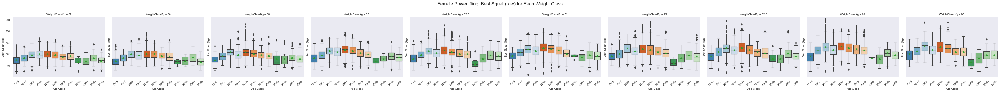

In [117]:
sns.set_style('darkgrid')
sns.set_context("paper")
femRaw.sort_values(by='WeightClassKg', inplace=True)
g = sns.catplot(x="AgeClass", y="Best3SquatKg", col="WeightClassKg",
                data=femRaw, kind="box",palette="tab20c",
                height=4, aspect=1.2, showmeans=True)
g.fig.subplots_adjust(top=1.3)
plt.suptitle('Female Powerlifting: Best Squat (raw) for Each Weight Class', fontsize=16, y=1.1)
#g.map(plt.axhline, y=100, ls=":", c=".5")
g.set(xlabel='Age Class', ylabel='Best Squat (kg)')
g.set_xticklabels(rotation=45)

g.fig.tight_layout(w_pad=1)

In [86]:
menRaw = firstRawFiltered[firstRawFiltered['Sex'] == 'M'].copy()
menRaw = filter_by_value_count(menRaw, 'WeightClassKg', 3000)
menRaw = filter_by_value_count(menRaw, 'AgeClass', 100)
menRaw['AgeClass'] = menRaw['AgeClass'].cat.remove_unused_categories()

In [118]:
get_value_counts(femRaw, 'AgeClass')

24-34    20451
20-23    10694
35-39     6707
40-44     6533
45-49     4855
18-19     3588
50-54     3296
16-17     3004
13-15     1934
55-59     1826
60-64     1020
65-69      237
Name: AgeClass, dtype: int64


In [66]:
menRaw['Best3SquatKg'].mean()
menRaw.head(10)


,Name,Sex,Event,Equipment,Age,AgeClass,BirthYearClass,Division,BodyweightKg,WeightClassKg,...,Country,Date,MeetCountry,MeetState,MeetName,Raw,timestamp,hour,day,weekday
608905,Aleksey Olegovich Ulanov,M,B,Raw,25.5,24-34,24-39,Amateur Open,98.0,100,...,NaN,2017-02-18,Russia,NaN,National Powerlifting Championships,True,2017-02-18,0,5,Saturday
1122778,Russell Jardine,M,B,Raw,25.0,24-34,24-39,M_OR_AAPF,98.5,100,...,USA,2016-04-21,USA,ID,Amateur Nationals,True,2016-04-21,0,3,Thursday
425155,Gary Topley,M,B,Raw,31.0,24-34,24-39,M-O,100.0,100,...,England,2016-08-06,England,NaN,South East Novice and Qualifier,True,2016-08-06,0,5,Saturday
1116242,Marvin Coleman,M,B,Raw,47.0,45-49,40-49,M_OR_APF,90.6,100,...,USA,2015-06-12,USA,MI,Raw Nationals,True,2015-06-12,0,4,Friday
641872,Vadim Kozlov,M,B,Raw,22.0,20-23,19-23,Juniors 20-23,94.2,100,...,NaN,2019-02-10,Russia,NaN,Helios Cup,True,2019-02-10,0,6,Sunday
641873,Sergey Kaverin,M,B,Raw,30.0,24-34,24-39,Open,95.9,100,...,NaN,2019-02-10,Russia,NaN,Helios Cup,True,2019-02-10,0,6,Sunday
641875,Sergey Gavrilov,M,B,Raw,44.0,40-44,40-49,Masters 40-44,97.6,100,...,NaN,2019-02-10,Russia,NaN,Helios Cup,True,2019-02-10,0,6,Sunday
1267791,Devon Fried,M,SBD,Raw,19.0,18-19,19-23,Juniors 18-19,96.6,100,...,USA,2020-02-15,USA,PA,Drug Tested My Iron Valentine Classic,True,2020-02-15,0,5,Saturday
641927,Eldar Dadashev,M,SBD,Raw,21.0,20-23,19-23,Open,98.7,100,...,NaN,2018-12-09,Russia,NaN,Southern Gates of Russia,True,2018-12-09,0,6,Sunday
1267807,Michael Treese,M,SBD,Raw,29.0,24-34,24-39,Open,99.2,100,...,USA,2020-02-15,USA,PA,Drug Tested My Iron Valentine Classic,True,2020-02-15,0,5,Saturday


In [93]:
def plot_squats(df, sex):
    sns.set_style('darkgrid')
    sns.set_context("paper")
    df.sort_values(by='WeightClassKg', inplace=True)
    g = sns.catplot(x="AgeClass", y="Best3SquatKg", col="WeightClassKg",
                data=df, kind="box",palette="tab20c",
                height=4, aspect=1.2)
    g.fig.subplots_adjust(top=1.3)
    plt.suptitle(f'{sex} Powerlifting: Best Squat (raw) for Each Weight Class', fontsize=16, y=1.1)
    #g.map(plt.axhline, y=df['Best3SquatKg'].mean(), ls=":", c=".5")
    g.set(xlabel='Age Class', ylabel='Best Squat (kg)')
    g.set_xticklabels(rotation=45)

    g.fig.tight_layout(w_pad=1)

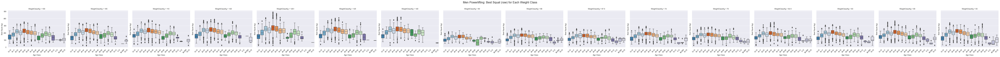

In [119]:
plot_squats(menRaw, 'Men')

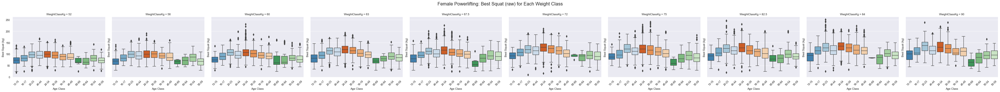

In [120]:
plot_squats(femRaw, 'Female')

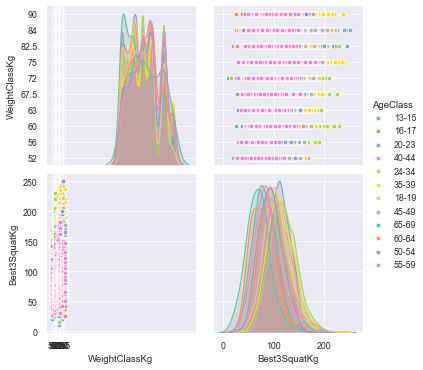

In [124]:
g = sns.pairplot(femRaw, hue="AgeClass", palette="Set2", height=2.5, vars=['WeightClassKg', 'Best3SquatKg'])


In [77]:
weight = femRaw[(femRaw['BodyweightKg'] >= 100) & (femRaw['Age'] < 20)]


In [78]:
weight.head(10)

,Name,Sex,Event,Equipment,Age,AgeClass,BirthYearClass,Division,BodyweightKg,WeightClassKg,...,Country,Date,MeetCountry,MeetState,MeetName,Raw,timestamp,hour,day,weekday


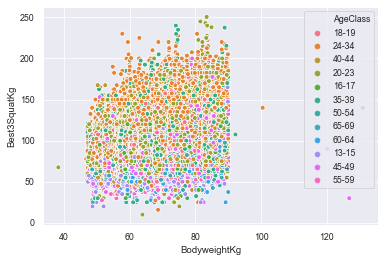

In [128]:
sns.scatterplot(data=femRaw, x='BodyweightKg', y='Best3SquatKg', hue='AgeClass')